In [1]:
!nvidia-smi

Sat Jun 10 15:45:22 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 528.49       Driver Version: 528.49       CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:01:00.0  On |                  N/A |
|  0%   43C    P8    21W / 370W |    647MiB / 12288MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
from mmengine.utils import get_git_hash
from mmengine.utils.dl_utils import collect_env as collect_base_env

import mmdet

# 环境信息收集和打印
def collect_env():
    """Collect the information of the running environments."""
    env_info = collect_base_env()
    env_info['MMDetection'] = f'{mmdet.__version__}+{get_git_hash()[:7]}'
    return env_info


if __name__ == '__main__':
    for name, val in collect_env().items():
        print(f'{name}: {val}')

sys.platform: win32
Python: 3.9.16 (main, Mar  8 2023, 10:39:24) [MSC v.1916 64 bit (AMD64)]
CUDA available: True
numpy_random_seed: 2147483648
GPU 0: NVIDIA GeForce RTX 3080
CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v11.2
NVCC: Cuda compilation tools, release 11.2, V11.2.152
MSVC: n/a, reason: fileno
PyTorch: 2.0.1+cu117
PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 193431937
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX2
  - CUDA Runtime 11.7
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_61,code=sm_61;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;

### 数据集可视化

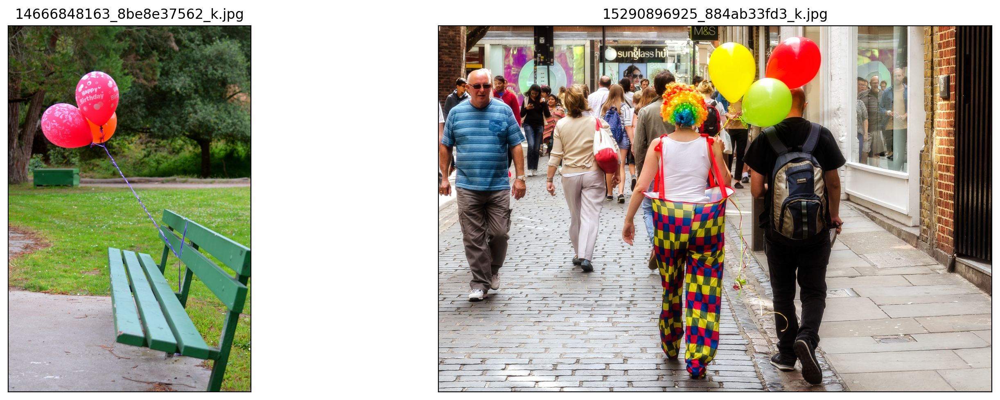

In [41]:
import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

image_paths= [filename for filename in os.listdir(r'E:\dataSetCollect\balloon_dataset\balloon\TRAIN')][10:12]

for i,filename in enumerate(image_paths):
    name = os.path.splitext(filename)[0]

    image = Image.open(r'E:/dataSetCollect/balloon_dataset/balloon/train/'+filename).convert("RGB")
  
    plt.subplot(1, 2, i+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()
plt.show()

### 可视化标签(手动读取原始json) 
##### refer to "https://github.com/CrabBoss-lab/"

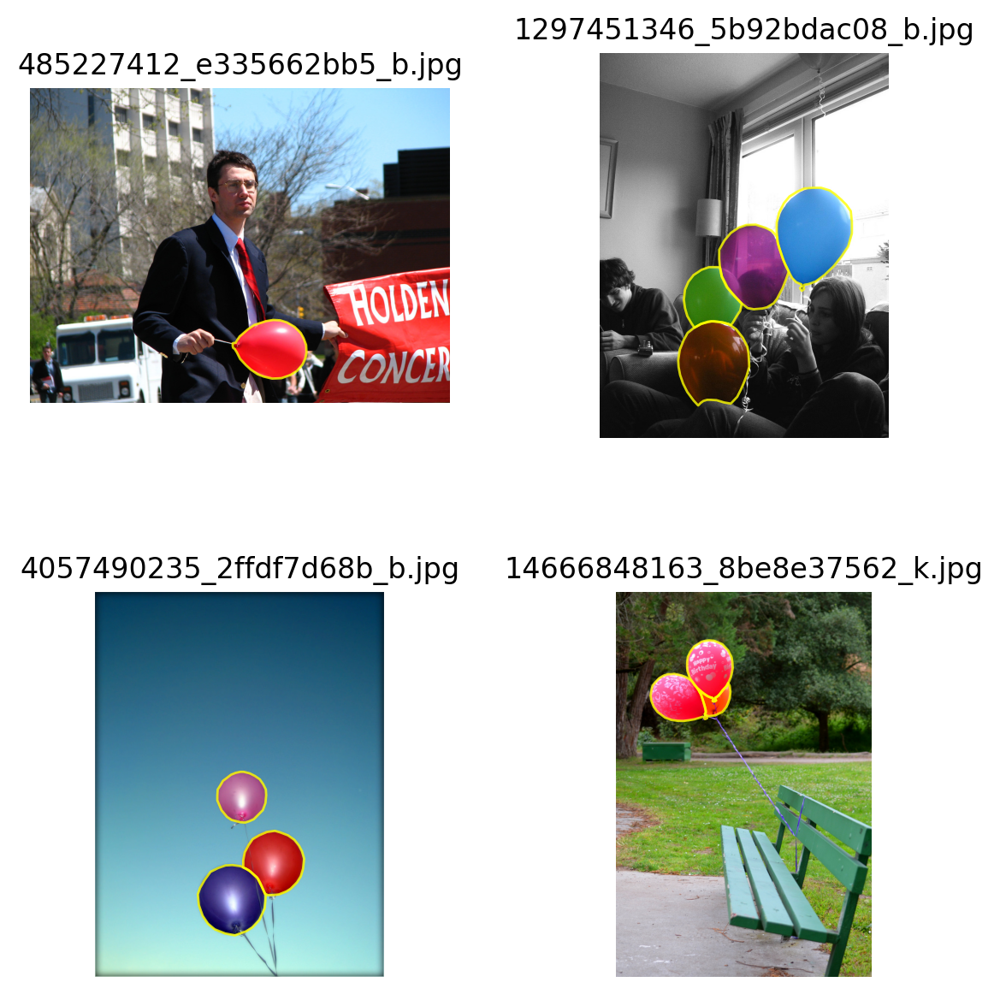

In [45]:
import json
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import random

# 读取JSON文件
with open('E:/dataSetCollect/balloon_dataset/balloon/train/via_region_data.json') as f:
    annotations = json.load(f)

# 获取所有图像的ID
image_ids = list(annotations.keys())

# 随机选择16个图像ID
random_image_ids = random.sample(image_ids, 4)

# 创建一个4x4的子图
fig, axs = plt.subplots(2, 2, figsize=(6, 6))

# 遍历每个图像ID
for i, image_id in enumerate(random_image_ids):
    # 获取图像的文件名和大小
    filename = annotations[image_id]['filename']
    size = annotations[image_id]['size']
    
    # 读取图像文件
    image = Image.open(f'E:/dataSetCollect/balloon_dataset/balloon/train/{filename}')
    
    # 获取多边形注释信息
    regions = annotations[image_id]['regions']
    patches = []
    for region_id, region_info in regions.items():
        # 获取多边形顶点坐标
        x = region_info['shape_attributes']['all_points_x']
        y = region_info['shape_attributes']['all_points_y']
        points = list(zip(x, y))
        
        # 创建多边形对象
        polygon = Polygon(points, closed=True)
        patches.append(polygon)
    
    # 计算子图的行和列索引
    row = i // 2
    col = i % 2
    
    # 在子图中显示图像和注释
    axs[row, col].imshow(image)
    axs[row, col].set_title(filename)
    p = PatchCollection(patches, alpha=0.8, facecolor='none', edgecolor='yellow')
    axs[row, col].add_collection(p)

# 调整子图的间距和轴的可见性
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.2, hspace=0.4)
for ax in axs.flat:
    ax.axis('off')

# 显示子图
plt.show()

### 原始json转coco
#### refer to 'https://github.com/CrabBoss-lab'

In [13]:
## 训练集转换
import json
import re
from collections import defaultdict
import cv2

# 读取JSON文件
with open('E:/dataSetCollect/balloon_dataset/balloon/train/via_region_data.json') as f:
    annotations = json.load(f)

# 初始化COCO格式字典
coco_dict = defaultdict(list)
coco_dict['info'] = {}
coco_dict['licenses'] = []
coco_dict['categories'] = []
coco_dict['images'] = []
coco_dict['annotations'] = []

# 添加info信息
coco_dict['info']['version'] = '1.0'
coco_dict['info']['description'] = 'Balloon Dataset'
coco_dict['info']['year'] = 2023
coco_dict['info']['contributor'] = 'YUJUNYU_WDQ' ## yjy_nb
coco_dict['info']['date_created'] = '2023-06-10'

# 添加categories信息
category_id = 1
category = {'id': category_id, 'name': 'balloon', 'supercategory': 'object'}
coco_dict['categories'].append(category)

# 遍历每个图像的注释信息
annotation_id = 1
for image_id, image_info in annotations.items():
    # 从image_id中提取出正确的图像ID
    match = re.search(r'(\d+)_.*', image_id)
    if match:
        image_id = match.group(1)
    else:
        continue
    
    # 获取图像的文件名和大小
    filename = image_info['filename']
    size = image_info['size']
    # 获取图像的height和width
    img = cv2.imread(os.path.join('E:/dataSetCollect/balloon_dataset/balloon/train/', filename))
    height, width, _ = img.shape
    # print(filename,height,width)
    
    # 添加图像信息
    image = {'id': int(image_id), 'file_name': filename, 'width': width, 'height': height}
    coco_dict['images'].append(image)
    
    # 获取多边形注释信息
    regions = image_info['regions']
    for region_id, region_info in regions.items():
        # 获取多边形顶点坐标
        x = region_info['shape_attributes']['all_points_x']
        y = region_info['shape_attributes']['all_points_y']
        points = list(zip(x, y))
        
        # 计算多边形的边界框
        xmin = min(x)
        xmax = max(x)
        ymin = min(y)
        ymax = max(y)
        width = xmax - xmin
        height = ymax - ymin
        
        # 添加注释信息
        annotation = {'id': annotation_id, 'image_id': int(image_id), 'category_id': category_id, 'segmentation': [points], 'area': width * height, 'bbox': [xmin, ymin, width, height], 'iscrowd': 0}
        coco_dict['annotations'].append(annotation)
        annotation_id += 1

# 保存COCO格式文件
with open('E:/dataSetCollect/balloon_dataset/balloon/train/balloon_train.json', 'w') as f:
    json.dump(coco_dict, f)

print('success！')

success！


In [15]:
## 测试集转换
import json
import re
from collections import defaultdict
import cv2

# 读取JSON文件
with open('E:/dataSetCollect/balloon_dataset/balloon/val/via_region_data.json') as f:
    annotations = json.load(f)

# 初始化COCO格式字典
coco_dict = defaultdict(list)
coco_dict['info'] = {}
coco_dict['licenses'] = []
coco_dict['categories'] = []
coco_dict['images'] = []
coco_dict['annotations'] = []

# 添加info信息
coco_dict['info']['version'] = '1.0'
coco_dict['info']['description'] = 'Balloon Dataset'
coco_dict['info']['year'] = 2023
coco_dict['info']['contributor'] = 'YUJUNYU_WDQ' ## yjy_nb
coco_dict['info']['date_created'] = '2023-06-10'

# 添加categories信息
category_id = 1
category = {'id': category_id, 'name': 'balloon', 'supercategory': 'object'}
coco_dict['categories'].append(category)

# 遍历每个图像的注释信息
annotation_id = 1
for image_id, image_info in annotations.items():
    # 从image_id中提取出正确的图像ID
    match = re.search(r'(\d+)_.*', image_id)
    if match:
        image_id = match.group(1)
    else:
        continue
    
    # 获取图像的文件名和大小
    filename = image_info['filename']
    size = image_info['size']
    # 获取图像的height和width
    img = cv2.imread(os.path.join('E:/dataSetCollect/balloon_dataset/balloon/val/', filename))
    height, width, _ = img.shape
    # print(filename,height,width)
    
    
    # 添加图像信息
    image = {'id': int(image_id), 'file_name': filename, 'width': width, 'height': height}
    coco_dict['images'].append(image)
    
    # 获取多边形注释信息
    regions = image_info['regions']
    for region_id, region_info in regions.items():
        # 获取多边形顶点坐标
        x = region_info['shape_attributes']['all_points_x']
        y = region_info['shape_attributes']['all_points_y']
        points = list(zip(x, y))
        
        # 计算多边形的边界框
        xmin = min(x)
        xmax = max(x)
        ymin = min(y)
        ymax = max(y)
        width = xmax - xmin
        height = ymax - ymin
        
        # 添加注释信息
        annotation = {'id': annotation_id, 'image_id': int(image_id), 'category_id': category_id, 'segmentation': [points], 'area': width * height, 'bbox': [xmin, ymin, width, height], 'iscrowd': 0}
        coco_dict['annotations'].append(annotation)
        annotation_id += 1

# 保存COCO格式文件
with open('E:/dataSetCollect/balloon_dataset/balloon/val/balloon_val.json', 'w') as f:
    json.dump(coco_dict, f)

print('success！')

success！


### COCO Json 可视化

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
照片序列号 [34020010494, 25899693952, 24362039530, 18849792632, 17178818589, 17156759330, 16435593892, 15717689633, 15331928994, 15290896925, 14666848163, 14321263043, 12288446656, 12288355124, 12288043903, 12037308314, 10464445726, 9330497995, 9210739293, 8758393087, 8436015314, 7488015492, 7308740338, 7178882742, 6483318883, 5674044810, 5560377994, 5253122239, 5178670692, 5013250607, 4955354786, 4887227769, 4864857993, 4552737035, 4543126482, 4057490235, 3945575930, 3927754171, 3646097131, 3342804367, 2937599387, 2685563244, 2385899600, 2354829160, 2311771643, 1297451346, 873768102, 699765866, 605521662, 518678836, 489752654, 485227412, 351678851, 332344155, 321888854, 155815494, 154446334, 145053828, 126700562, 120853323, 53500107] 61


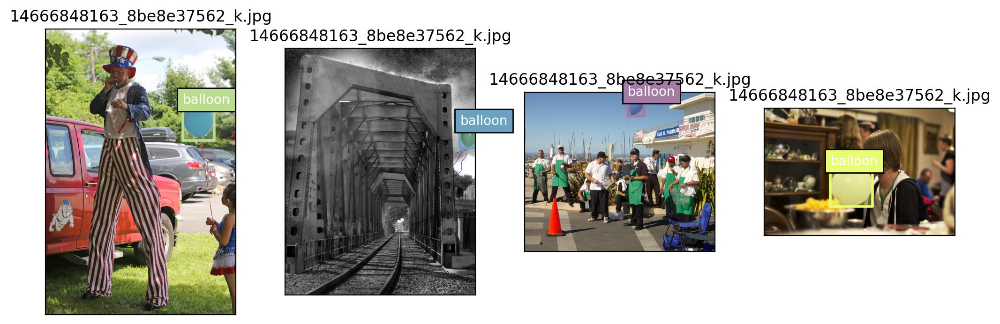

In [47]:
from pycocotools.coco import COCO
import numpy as np
import os.path as osp
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon

def apply_exif_orientation(image):
    _EXIF_ORIENT = 274
    if not hasattr(image, 'getexif'):
        return image

    try:
        exif = image.getexif()
    except Exception:
        exif = None

    if exif is None:
        return image

    orientation = exif.get(_EXIF_ORIENT)

# out = im.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
# out = im.transpose(Image.Transpose.FLIP_TOP_BOTTOM)
# out = im.transpose(Image.Transpose.ROTATE_90)
# out = im.transpose(Image.Transpose.ROTATE_180)
# out = im.transpose(Image.Transpose.ROTATE_270)
    
    method = {
        2: Image.Transpose.FLIP_LEFT_RIGHT,
        3: Image.Transpose.ROTATE_180,
        4: Image.Transpose.FLIP_TOP_BOTTOM,
        5: Image.Transpose.TRANSPOSE,
        6: Image.Transpose.ROTATE_270,
        7: Image.Transpose.TRANSVERSE,
        8: Image.Transpose.ROTATE_90,
    }.get(orientation)
    if method is not None:
        return image.transpose(method)
    return image


def show_bbox_only(coco, anns, show_label_bbox=True, is_filling=True):
    """Show bounding box of annotations Only."""
    if len(anns) == 0:
        return

    ax = plt.gca()
    ax.set_autoscale_on(False)

    image2color = dict()
    for cat in coco.getCatIds():
        image2color[cat] = (np.random.random((1, 3)) * 0.7 + 0.3).tolist()[0]

    polygons = []
    colors = []

    for ann in anns:
        color = image2color[ann['category_id']]
        bbox_x, bbox_y, bbox_w, bbox_h = ann['bbox']
        poly = [[bbox_x, bbox_y], [bbox_x, bbox_y + bbox_h],
                [bbox_x + bbox_w, bbox_y + bbox_h], [bbox_x + bbox_w, bbox_y]]
        polygons.append(Polygon(np.array(poly).reshape((4, 2))))
        colors.append(color)

        if show_label_bbox:
            label_bbox = dict(facecolor=color)
        else:
            label_bbox = None

        ax.text(
            bbox_x,
            bbox_y,
            '%s' % (coco.loadCats(ann['category_id'])[0]['name']),
            color='white',
            bbox=label_bbox)

    if is_filling:
        p = PatchCollection(
            polygons, facecolor=colors, linewidths=0, alpha=0.4)
        ax.add_collection(p)
    p = PatchCollection(
        polygons, facecolor='none', edgecolors=colors, linewidths=2)
    ax.add_collection(p)

    
coco = COCO(r'E:\dataSetCollect\balloon_dataset\balloon\train/balloon_train.json')
image_ids = coco.getImgIds()
print("照片序列号",image_ids,len(image_ids))
np.random.shuffle(image_ids)

plt.figure(figsize=(10, 4))

# 只可视化 8 张图片
for i in range(4):
    image_data = coco.loadImgs(image_ids[i])[0]
    image_path = osp.join('E:/dataSetCollect/balloon_dataset/balloon/train/',image_data['file_name'])
    annotation_ids = coco.getAnnIds(
            imgIds=image_data['id'], catIds=[], iscrowd=0)
    annotations = coco.loadAnns(annotation_ids)
    
    ax = plt.subplot(1, 4, i+1)
    image = Image.open(image_path).convert("RGB")
    
    # 这行代码很关键，否则可能图片和标签对不上
    image=apply_exif_orientation(image)
    
    ax.imshow(image)
    
    show_bbox_only(coco, annotations)
    
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])
        
plt.tight_layout()  

### 自定义配置文件

In [23]:
# 当前路径位于 mmdetection/tutorials, 配置将写到 mmdetection/tutorials 路径下

config_balloon = """
_base_ = 'D:/ACpycharm/myProjeycs/mmdetection-main/configs/rtmdet/rtmdet_tiny_8xb32-300e_coco.py'

data_root = 'E:/dataSetCollect/balloon_dataset/balloon/'

# 非常重要
metainfo = {
    # 类别名，注意 classes 需要是一个 tuple，因此即使是单类，
    # 你应该写成 `balloon,` 很多初学者经常会在这犯错 ，palette：调色板
    'classes': ('balloon',),
    'palette': [
        (220, 20, 60),
    ]
}
num_classes = 1

# 训练 40 epoch
max_epochs = 40
# 训练单卡 bs= 12
train_batch_size_per_gpu = 8
# 可以根据自己的电脑修改
train_num_workers = 4

# 验证集 batch size 为 1
val_batch_size_per_gpu = 1
val_num_workers = 2

# RTMDet 训练过程分成 2 个 stage，第二个 stage 会切换数据增强 pipeline
num_epochs_stage2 = 5

# batch 改变了，学习率也要跟着改变， 0.004 是 8卡x32 的学习率
base_lr = 8 * 0.004 / (32*8)

# 采用 COCO 预训练权重
load_from = 'https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_tiny_8xb32-300e_coco/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'  # noqa

model = dict(
    # 考虑到数据集太小，且训练时间很短，我们把 backbone 完全固定
    # 用户自己的数据集可能需要解冻 backbone
    backbone=dict(frozen_stages=4),
    # 不要忘记修改 num_classes ，代码17行
    bbox_head=dict(dict(num_classes=num_classes)))

# 数据集不同，dataset 输入参数也不一样
train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    pin_memory=False,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        ann_file='E:/dataSetCollect/balloon_dataset/balloon/train/balloon_train.json',
        data_prefix=dict(img='E:/dataSetCollect/balloon_dataset/balloon/train/')))

val_dataloader = dict(
    batch_size=val_batch_size_per_gpu,
    num_workers=val_num_workers,
    dataset=dict(
        metainfo=metainfo,
        data_root=data_root,
        ann_file='E:/dataSetCollect/balloon_dataset/balloon/val/balloon_val.json',
        data_prefix=dict(img='E:/dataSetCollect/balloon_dataset/balloon/val/')))

test_dataloader = val_dataloader

# 默认的学习率调度器是 warmup 1000，但是 cat 数据集太小了，需要修改 为 30 iter
param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=30),
    dict(
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,  # max_epoch 也改变了
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]
optim_wrapper = dict(optimizer=dict(lr=base_lr))

# 第二 stage 切换 pipeline 的 epoch 时刻也改变了
_base_.custom_hooks[1].switch_epoch = max_epochs - num_epochs_stage2

val_evaluator = dict(ann_file=data_root + 'val/balloon_val.json')
test_evaluator = val_evaluator

# 一些打印设置修改
default_hooks = dict(
    checkpoint=dict(interval=10, max_keep_ckpts=2, save_best='auto'),  # 同时保存最好性能权重
    logger=dict(type='LoggerHook', interval=5))
train_cfg = dict(max_epochs=max_epochs, val_interval=10)
"""

with open('rtmdet_tiny_1xb12-40e_balloon.py', 'w',encoding="UTF-8") as f:
    f.write(config_balloon)
    print("配置生成完成。")

配置生成完成。


### 训练前可视化验证

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\mmengine\utils\manager.py:113: UserWarning: <class 'mmdet.visualization.local_visualizer.DetLocalVisualizer'> instance named of visualizer has been created, the method `get_instance` should not accept any other arguments
  warnings.warn(


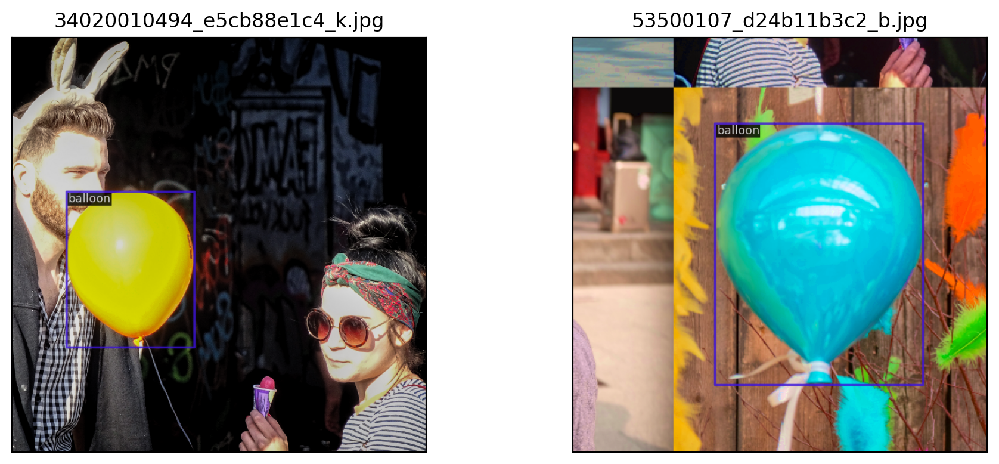

In [48]:
from mmdet.registry import DATASETS, VISUALIZERS
from mmengine.config import Config
from mmengine.registry import init_default_scope

cfg = Config.fromfile('rtmdet_tiny_1xb12-40e_balloon.py')

init_default_scope(cfg.get('default_scope', 'mmdet'))

dataset = DATASETS.build(cfg.train_dataloader.dataset)
visualizer = VISUALIZERS.build(cfg.visualizer)
visualizer.dataset_meta = dataset.metainfo

plt.figure(figsize=(10, 4))

# 只可视化前 8 张图片
for i in range(2):
    item=dataset[i]

    img = item['inputs'].permute(1, 2, 0).numpy()
    data_sample = item['data_samples'].numpy()
    gt_instances = data_sample.gt_instances
    img_path = osp.basename(item['data_samples'].img_path)

    gt_bboxes = gt_instances.get('bboxes', None)
    gt_instances.bboxes = gt_bboxes.tensor
    data_sample.gt_instances = gt_instances

    visualizer.add_datasample(
            osp.basename(img_path),
            img,
            data_sample,
            draw_pred=False,
            show=False)
    drawed_image=visualizer.get_image()

    plt.subplot(1, 2, i+1)
    plt.imshow(drawed_image[..., [2, 1, 0]])
    plt.title(f"{osp.basename(img_path)}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()  

### 模型训练

In [25]:
!python D:\ACpycharm\myProjeycs\mmdetection-main\tools\train.py rtmdet_tiny_1xb12-40e_balloon.py

06/10 17:00:21 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.9.16 (main, Mar  8 2023, 10:39:24) [MSC v.1916 64 bit (AMD64)]
    CUDA available: True
    numpy_random_seed: 1595527687
    GPU 0: NVIDIA GeForce RTX 3080
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v11.2
    NVCC: Cuda compilation tools, release 11.2, V11.2.152
    MSVC: 用于 x64 的 Microsoft (R) C/C++ 优化编译器 19.29.30146 版
    GCC: n/a
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 193431937
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX2
  - CUDA Runtime 11.7
  - NVCC architecture flags: -gencode;arch=compute_37,c

Downloading: "https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_tiny_8xb32-300e_coco/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth" to C:\Users\WDQ/.cache\torch\hub\checkpoints\rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth
D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3484.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


### 模型测试和推理

In [28]:
!python D:\ACpycharm\myProjeycs\mmdetection-main\tools\test.py rtmdet_tiny_1xb12-40e_balloon.py D:/ACanaconda/jupyternotebookPro/01OpenmmlabTwo/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth  --show-dir results

06/10 17:13:25 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.9.16 (main, Mar  8 2023, 10:39:24) [MSC v.1916 64 bit (AMD64)]
    CUDA available: True
    numpy_random_seed: 85534617
    GPU 0: NVIDIA GeForce RTX 3080
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v11.2
    NVCC: Cuda compilation tools, release 11.2, V11.2.152
    MSVC: 用于 x64 的 Microsoft (R) C/C++ 优化编译器 19.29.30146 版
    GCC: n/a
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 193431937
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX2
  - CUDA Runtime 11.7
  - NVCC architecture flags: -gencode;arch=compute_37,cod

D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3484.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\mmengine\visualization\visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\mmengine\visualization\visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(
D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\mmengine\visualization\visualizer.py:505: UserWarning: Warning: The text is out of bounds, the drawn text may not be in the image
  war

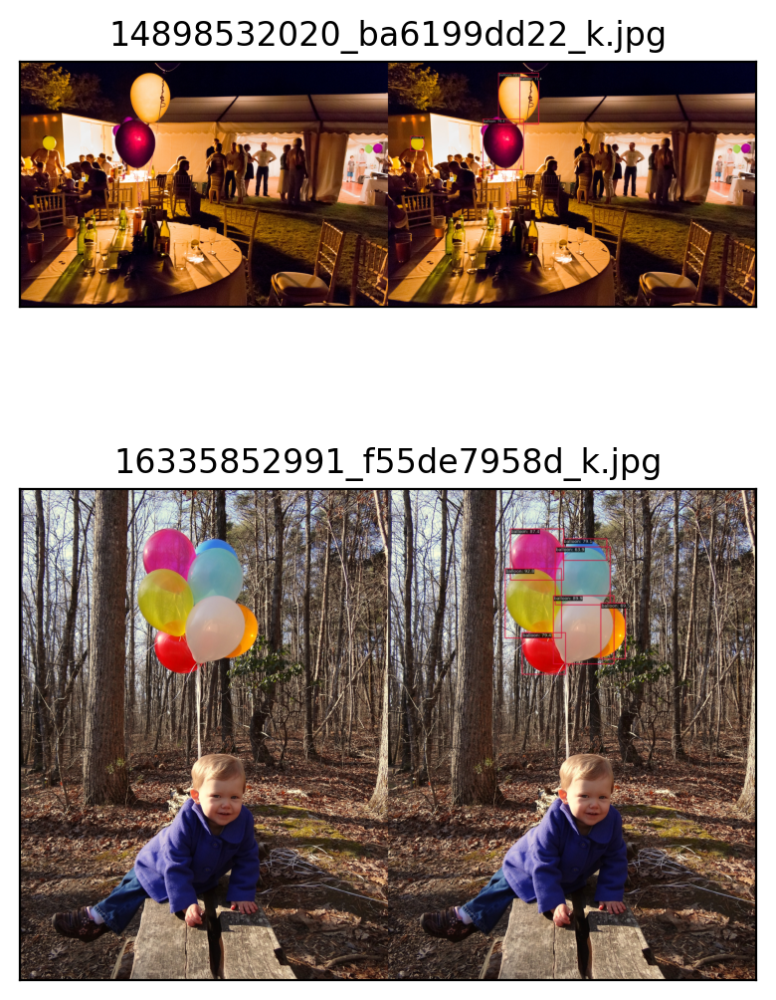

In [49]:
# 数据集可视化

import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline

plt.figure(figsize=(4, 6))

# 你如果重新跑，这个时间戳是不一样的，需要自己修改
root_path=r'D:\ACanaconda\jupyternotebookPro\01OpenmmlabTwo\work_dirs\rtmdet_tiny_1xb12-40e_balloon\20230610_171319\results/'
image_paths= [filename for filename in os.listdir(root_path)][:2]

for i,filename in enumerate(image_paths):
    name = os.path.splitext(filename)[0]

    image = Image.open(root_path+filename).convert("RGB")
  
    plt.subplot(2, 1, i+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### 可视化分析

In [33]:
import cv2

img = cv2.imread('E:/dataSetCollect/balloon_dataset/balloon/train/3646097131_e3e1215843_b.jpg')
h,w=img.shape[:2]
resized_img = cv2.resize(img, (640, 640))
cv2.imwrite('resized_image.jpg', resized_img)

True

D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3484.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\mmengine\visualization\visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([80, 80]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warnings.warn(
D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\mmengine\visualization\visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([40, 40]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warn

Loads checkpoint by local backend from path: D:/ACanaconda/jupyternotebookPro/01OpenmmlabTwo/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth
06/10 19:09:28 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 0.3 task/s, elapsed: 4s, ETA:     0sAll done!
Results have been saved at D:\ACanaconda\jupyternotebookPro\01OpenmmlabTwo\output


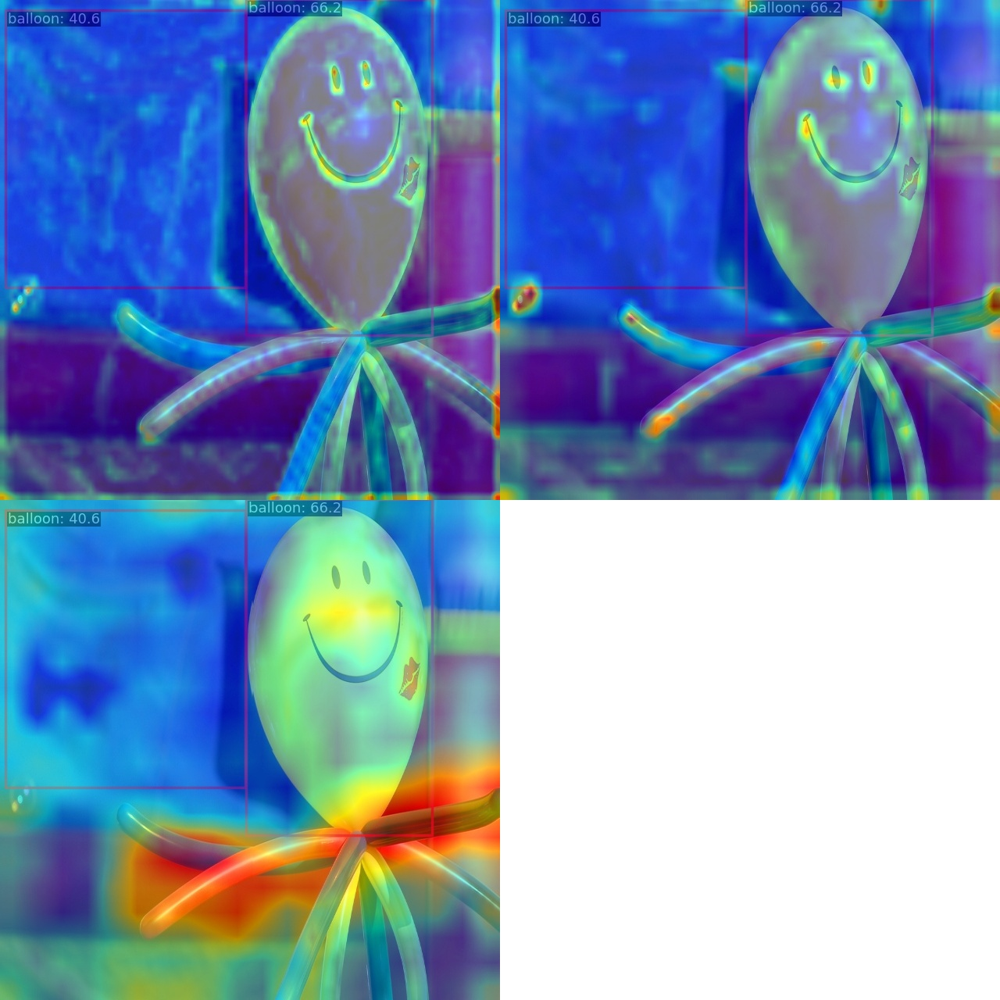

In [34]:
!python D:/ACpycharm/myProjeycs/mmyolo-main/demo/featmap_vis_demo.py \
      resized_image.jpg \
      rtmdet_tiny_1xb12-40e_balloon.py \
      D:/ACanaconda/jupyternotebookPro/01OpenmmlabTwo/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth  \
      --target-layers backbone  \
      --channel-reduction squeeze_mean
Image.open('output/resized_image.jpg')    

#### 可视化 neck 输出的 3 个通道

D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3484.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\mmengine\visualization\visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([80, 80]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warnings.warn(
D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\mmengine\visualization\visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([40, 40]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warn

Loads checkpoint by local backend from path: D:/ACanaconda/jupyternotebookPro/01OpenmmlabTwo/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth
06/10 19:12:56 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 0.7 task/s, elapsed: 1s, ETA:     0sAll done!
Results have been saved at D:\ACanaconda\jupyternotebookPro\01OpenmmlabTwo\output


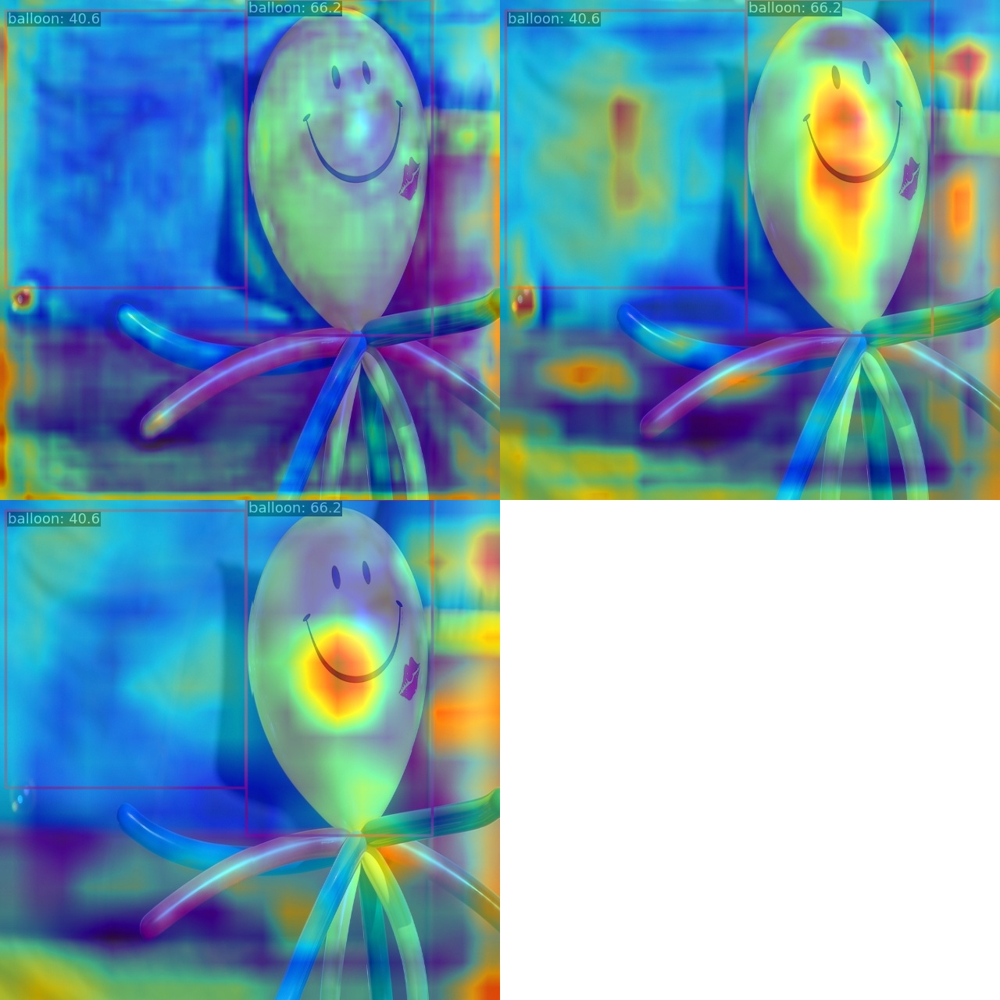

In [36]:
!python D:/ACpycharm/myProjeycs/mmyolo-main/demo/featmap_vis_demo.py \
      resized_image.jpg \
      rtmdet_tiny_1xb12-40e_balloon.py \
      D:/ACanaconda/jupyternotebookPro/01OpenmmlabTwo/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth  \
      --target-layers neck  \
      --channel-reduction squeeze_mean
Image.open('output/resized_image.jpg') 

### Grad-Based CAM 可视化

In [37]:
!pip install "grad-cam"

     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/7.8 MB 103.4 kB/s eta 0:01:15
     ---------------------------------------- 0.0/7.8 MB 103.4 kB/s eta 0:01:15
     ---------------------------------------- 0.0/7.8 MB 103.4 kB/s eta 0:01:15
     ---------------------------------------- 0.0/7.8 MB 103.4 kB/s eta 0:01:15
     ---------------------------------------- 0.0/7.8 MB 103.4 kB/s eta 0:01:15
     ---------------------------------------- 0.0/7.8 MB 103.4 kB/s eta 0:01:15
     ------------------

#### 查看 neck 输出的最小输出特征图的 Grad CAM

Traceback (most recent call last):
  File "D:\ACpycharm\myProjeycs\mmyolo-main\demo\boxam_vis_demo.py", line 276, in <module>
    main()
  File "D:\ACpycharm\myProjeycs\mmyolo-main\demo\boxam_vis_demo.py", line 212, in main
    result = model_wrapper()[0]
  File "c:\users\wdq\mmyolo\mmyolo\utils\boxam_utils.py", line 222, in __call__
    self.detector.bbox_head.head_module.training = False
  File "D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\torch\nn\modules\module.py", line 1614, in __getattr__
    raise AttributeError("'{}' object has no attribute '{}'".format(
AttributeError: 'RTMDetSepBNHead' object has no attribute 'head_module'


The algorithm currently used is rtmdet
Loads checkpoint by local backend from path: D:/ACanaconda/jupyternotebookPro/01OpenmmlabTwo/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth
[                                                  ] 0/1, elapsed: 0s, ETA:


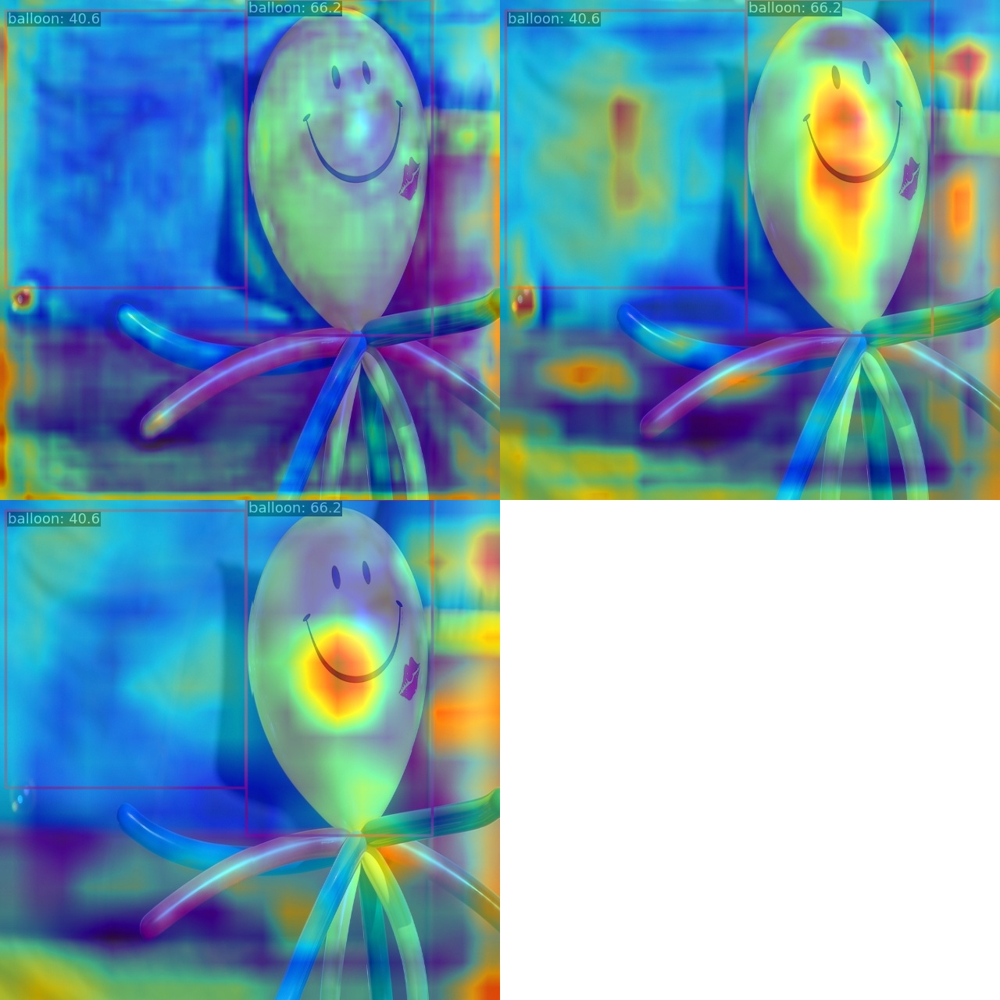

In [38]:
!python D:\ACpycharm\myProjeycs\mmyolo-main\demo\boxam_vis_demo.py \
      resized_image.jpg \
      rtmdet_tiny_1xb12-40e_balloon.py \
      D:/ACanaconda/jupyternotebookPro/01OpenmmlabTwo/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth  \
      --target-layer neck.out_convs[2]
Image.open('output/resized_image.jpg')     

The algorithm currently used is rtmdet
Loads checkpoint by local backend from path: D:/ACanaconda/jupyternotebookPro/01OpenmmlabTwo/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth
[                                                  ] 0/1, elapsed: 0s, ETA:


Traceback (most recent call last):
  File "D:\ACpycharm\myProjeycs\mmyolo-main\demo\boxam_vis_demo.py", line 276, in <module>
    main()
  File "D:\ACpycharm\myProjeycs\mmyolo-main\demo\boxam_vis_demo.py", line 212, in main
    result = model_wrapper()[0]
  File "c:\users\wdq\mmyolo\mmyolo\utils\boxam_utils.py", line 222, in __call__
    self.detector.bbox_head.head_module.training = False
  File "D:\ACanaconda\condainstall\envs\mymmlab\lib\site-packages\torch\nn\modules\module.py", line 1614, in __getattr__
    raise AttributeError("'{}' object has no attribute '{}'".format(
AttributeError: 'RTMDetSepBNHead' object has no attribute 'head_module'


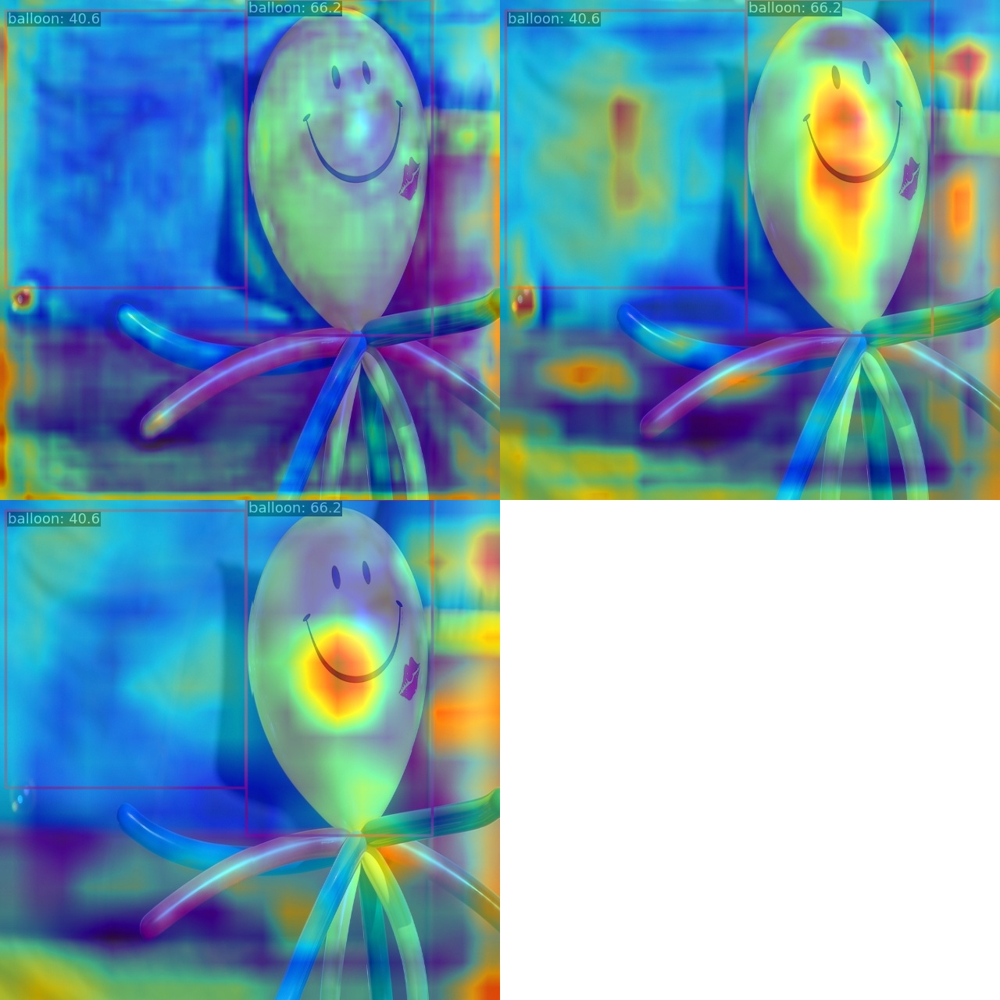

In [40]:
!python D:\ACpycharm\myProjeycs\mmyolo-main\demo\boxam_vis_demo.py \
      resized_image.jpg \
      rtmdet_tiny_1xb12-40e_balloon.py \
      D:/ACanaconda/jupyternotebookPro/01OpenmmlabTwo/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth  \
      --target-layer neck.out_convs[0]
Image.open('output/resized_image.jpg')  